# 0. Basic Imports

## 0.1. Libraries and Raw Data CSV files.

In [2]:
# Basic Libraries
import seaborn as sb
import numpy as np
import pandas as pd
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics

In [3]:
calender_data = pd.read_csv('calendar.csv')
#calender_data.head()

In [4]:
reviews_data = pd.read_csv('reviews.csv')
#reviews_data.head(1000)

In [5]:
listings_data = pd.read_csv('listings.csv')
#listings_data.head()

## 0.2. Generate uncleaned dataframes for predictors and response.

We aim to use the predictors...

In [6]:
#predictors1 =  pd.DataFrame(calender_data)

In [7]:
#Predictor from Reviews.csv
predictors2 =  pd.DataFrame(reviews_data[["listing_id","comments"]])
predictors2.head()

,listing_id,comments
0,7202016,Cute and cozy place. Perfect location to every...
1,7202016,Kelly has a great room in a very central locat...
2,7202016,"Very spacious apartment, and in a great neighb..."
3,7202016,Close to Seattle Center and all it has to offe...
4,7202016,Kelly was a great host and very accommodating ...


In [6]:
#Predictor from Listings.csv
predictors3 =  pd.DataFrame(listings_data[['id',"host_since","host_response_time","host_response_rate",
                                          "host_is_superhost",'neighbourhood_cleansed',"host_total_listings_count",
                                           "accommodates","property_type","room_type","bed_type","amenities","price","minimum_nights",
                                          'review_scores_rating','review_scores_accuracy','review_scores_cleanliness',
                                          'review_scores_checkin','review_scores_communication','review_scores_location',
                                           'review_scores_value','instant_bookable','cancellation_policy'
                                          ,'require_guest_profile_picture','require_guest_phone_verification']])
#predictors3.head()

... to predict the response: How often a AirBnB Listing gets customers, as indicated by how many reviews it has. (Estimated 70% of all customers leaves a review.)

In [22]:
#Response from Listings.csv.
response = listings_data[['id', 'number_of_reviews', 'reviews_per_month', 'host_since', 'calendar_last_scraped']]
#response.head()

## 0.3. Quick look at the uncleaned data.

In [23]:
predictors2.info()
print()
predictors3.info()
print()
response.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84849 entries, 0 to 84848
Data columns (total 2 columns):
listing_id    84849 non-null int64
comments      84831 non-null object
dtypes: int64(1), object(1)
memory usage: 1.3+ MB

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3818 entries, 0 to 3817
Data columns (total 25 columns):
id                                  3818 non-null int64
host_since                          3816 non-null object
host_response_time                  3295 non-null object
host_response_rate                  3295 non-null object
host_is_superhost                   3816 non-null object
neighbourhood_cleansed              3818 non-null object
host_total_listings_count           3816 non-null float64
accommodates                        3818 non-null int64
property_type                       3817 non-null object
room_type                           3818 non-null object
bed_type                            3818 non-null object
amenities                           3

# 1. Data Cleaning (Feature Construction/Engineering)

## 1.1. Response:
Creating new column with Total Number of Reviews / Total Days Listing has been on AirBnB

In [24]:
#This cell creates a new column into response with:
#Total Number of Reviews / Total Days Listing has been on AirBnB

from datetime import date

def date_string_to_int(dat):
    '''Converts a date written in string to a date, for numerical caculations.'''
    year = int(dat[0])*1000 + int(dat[1])*100 + int(dat[2])*10 + int(dat[3])
    month = int(dat[5])*10 + int(dat[6])
    day = int(dat[8])*10 + int(dat[9])

    return(date(year, month, day))

#Creates a placeholder dictionary to store values in.
no_of_total_reviews = {"id" : [],
                     "total_reviews_per_days_of_existence" : []}

#For every row: Divide total reviews by total days on AirBnB
for index, row in response.iterrows():
    #Appends each ID to the placeholder dictionary.
    no_of_total_reviews["id"].append(row['id'])

    try:
        first = date_string_to_int(row['host_since'])
        last = date_string_to_int(row['calendar_last_scraped'])
        duration_on_airbnb = last - first
        reviews_per_day = row['number_of_reviews'] / (duration_on_airbnb.days + 1)
    
    #If listing's "Host Since" column is empty, adds an error message to the row for that listing.
    except:
        reviews_per_day = np.nan
    
    #Appends each total reviews / total days value to placeholder dictionary.
    no_of_total_reviews["total_reviews_per_days_of_existence"].append(reviews_per_day)

#Changes placeholder dictionary into Dataframe.
temp_dataframe = pd.DataFrame(no_of_total_reviews)

#Adds the Total Number of Reviews / Total Days Listing has been on AirBnB to Response.
response['total_reviews_per_days_of_existence'] = temp_dataframe["total_reviews_per_days_of_existence"]
response.head()

C:\Users\Clive\Anaconda3\lib\site-packages\ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,id,number_of_reviews,reviews_per_month,host_since,calendar_last_scraped,total_reviews_per_days_of_existence
0,241032,207,4.07,2011-08-11,2016-01-04,0.128731
1,953595,43,1.48,2013-02-21,2016-01-04,0.041031
2,3308979,20,1.15,2014-06-12,2016-01-04,0.034965
3,7421966,0,NaN,2013-11-06,2016-01-04,0.000000
4,278830,38,0.89,2011-11-29,2016-01-04,0.025367


In [40]:
#Saved on computer.
response.to_csv(r"C:\Users\Clive\Desktop\DSAI Module\Project\Response.csv")

From here onwards, we have the 2 columns we want as responses in our response dataframe.
* Reviews per Month
* Total Reviews per Days on AirBnB

In [12]:
#Quick analysis between the 2 columns:

#Creates a placeholder dictionary to store values in.
analysis_dict = {"id" : [],
                "difference_between_reviews_per_month_&_reviews_per_days" : []}

for index, row in response.iterrows():
    #Appends each ID to the placeholder dictionary.
    analysis_dict["id"].append(row['id'])

    reviews_from_months = float(row['reviews_per_month'] * 12)

    #To tackle those rows which are not listed yet.
    if row['total_reviews_per_days_of_existence'] == "Listing has not been on AirBnB yet!":
        reviews_from_days = 0
    else:
        reviews_from_days = float(row['total_reviews_per_days_of_existence'] * 365)
    
    #Gets the absolute difference between the 2 review counts, converted to years.
    analysis_dict["difference_between_reviews_per_month_&_reviews_per_days"].append(abs(reviews_from_months - reviews_from_days))

analysis_dict["difference_between_reviews_per_month_&_reviews_per_days"]

difference_dataframe = pd.DataFrame(analysis_dict)

difference_dataframe.describe()

,id,difference_between_reviews_per_month_&_reviews_per_days
count,3.818000e+03,3191.000000
mean,5.550111e+06,11.445848
std,2.962660e+06,14.206163
min,3.335000e+03,0.000696
25%,3.258256e+06,1.678346
50%,6.118244e+06,6.108044
75%,8.035127e+06,16.092131
max,1.034016e+07,112.947017


From the basic statistical calculations for the absolute difference between reviews/month and reviews/day (after converting them both to a year's duration), the average difference in reviews is 11.45 days.

C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Clive\Anaconda3\lib\site-

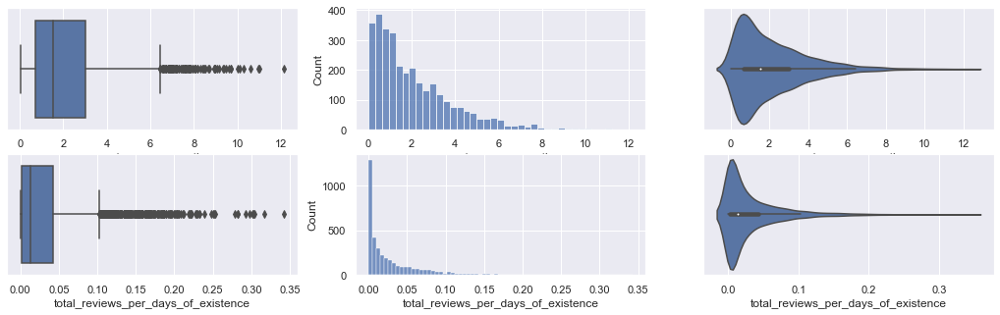

In [13]:
#Describe response.
months_vs_days = response[["reviews_per_month", "total_reviews_per_days_of_existence"]]

f, axes = plt.subplots(2, 3, figsize=(18, 5))

count = 0
for var in months_vs_days:
    sb.boxplot(months_vs_days[var], orient = "h" , ax = axes[count,0])
    sb.histplot(months_vs_days[var], ax = axes[count,1])
    sb.violinplot(months_vs_days[var], ax = axes[count,2],orient='h')
    count += 1

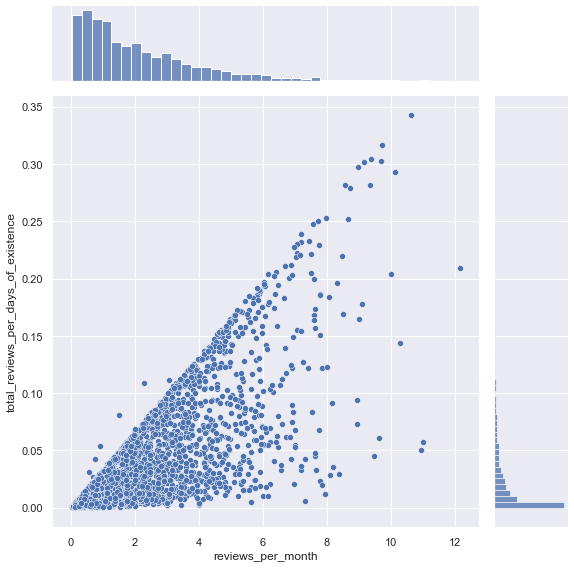

In [14]:
#Correleation Coefficient of reviews/month vs reviews/days.
sb.jointplot(x = months_vs_days["reviews_per_month"], y = months_vs_days["total_reviews_per_days_of_existence"], height = 8 )

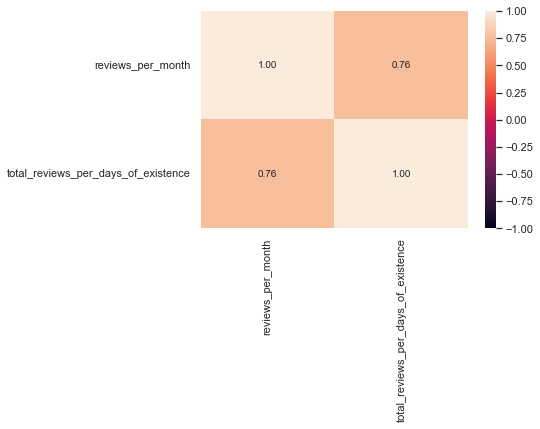

In [15]:
sb.heatmap(months_vs_days.corr(), vmin = -1, vmax = 1, annot = True, fmt=".2f")

Although reviews/month doesn't follow a perfectly proportionate relationship to reviews/day, their correleation coefficient is fairly high at 0.76, and as such, makes sense.

## 1.2. One Hot Encoding
One hot encoding converts a column that has catagorical data into multiple columns for each possible value with binary values.

One hot encoding is applied on columns from predictors3 to form a compiled dataframe.

In [7]:
#One Hot encodings.
id_df = predictors3["id"]

one_hot_nc_df = pd.get_dummies(predictors3['neighbourhood_cleansed'],prefix='nc')
one_hot_property_type_df = pd.get_dummies(predictors3['property_type'],prefix='pt')
one_hot_room_type_df = pd.get_dummies(predictors3['room_type'],prefix='rt')
one_hot_bed_type_df = pd.get_dummies(predictors3['bed_type'],prefix='bt')
one_hot_df = pd.concat([id_df,one_hot_nc_df,one_hot_property_type_df,one_hot_room_type_df,one_hot_bed_type_df ],axis=1)
one_hot_df.head()

,id,nc_Adams,nc_Alki,nc_Arbor Heights,nc_Atlantic,nc_Belltown,nc_Bitter Lake,nc_Briarcliff,nc_Brighton,nc_Broadview,nc_Broadway,nc_Bryant,nc_Cedar Park,nc_Central Business District,nc_Columbia City,nc_Crown Hill,nc_Dunlap,nc_East Queen Anne,nc_Eastlake,nc_Fairmount Park,nc_Fauntleroy,nc_First Hill,nc_Fremont,nc_Gatewood,nc_Genesee,nc_Georgetown,nc_Green Lake,nc_Greenwood,nc_Haller Lake,nc_Harrison/Denny-Blaine,nc_High Point,nc_Highland Park,nc_Holly Park,nc_Industrial District,nc_Interbay,nc_International District,nc_Laurelhurst,nc_Lawton Park,nc_Leschi,nc_Lower Queen Anne,nc_Loyal Heights,nc_Madison Park,nc_Madrona,nc_Mann,nc_Maple Leaf,nc_Matthews Beach,nc_Meadowbrook,nc_Mid-Beacon Hill,nc_Minor,nc_Montlake,nc_Mount Baker,nc_North Admiral,nc_North Beach/Blue Ridge,nc_North Beacon Hill,nc_North College Park,nc_North Delridge,nc_North Queen Anne,nc_Olympic Hills,nc_Phinney Ridge,nc_Pike-Market,nc_Pinehurst,nc_Pioneer Square,nc_Portage Bay,nc_Rainier Beach,nc_Ravenna,nc_Riverview,nc_Roosevelt,nc_Roxhill,nc_Seaview,nc_Seward Park,nc_South Beacon Hill,nc_South Delridge,nc_South Lake Union,nc_South Park,nc_Southeast Magnolia,nc_Stevens,nc_Sunset Hill,nc_University District,nc_Victory Heights,nc_View Ridge,nc_Wallingford,nc_Wedgwood,nc_West Queen Anne,nc_West Woodland,nc_Westlake,nc_Whittier Heights,nc_Windermere,nc_Yesler Terrace,pt_Apartment,pt_Bed & Breakfast,pt_Boat,pt_Bungalow,pt_Cabin,pt_Camper/RV,pt_Chalet,pt_Condominium,pt_Dorm,pt_House,pt_Loft,pt_Other,pt_Tent,pt_Townhouse,pt_Treehouse,pt_Yurt,rt_Entire home/apt,rt_Private room,rt_Shared room,bt_Airbed,bt_Couch,bt_Futon,bt_Pull-out Sofa,bt_Real Bed
0,241032,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
1,953595,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
2,3308979,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1
3,7421966,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
4,278830,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1


## 1.3. Integer Encoding
Integer encoding converts a column that has catagorical data into integer data. This can only be done if the categories can be logically ranked.

Take note: While we know that 3 > 1, the numeric value of 3 - 1 is useless.

Integer encoding is applied on columns from predictors3 to form a compiled dataframe.

In [37]:
#Integer encodings.

# non_null: hrt = 3295 , superhost = 3816 , cancellation = 3818 , instant_bookable = 3818 , req_guest_profile = 3818 
# non_null: req_guest_phone_ver = 3818
check2_df = predictors3[["id","host_response_time",'host_is_superhost','cancellation_policy','instant_bookable',
                       'require_guest_profile_picture','require_guest_phone_verification']]
integer_encoder_df = check2_df

cleanup_nums = { "host_response_time" :  {'within an hour':0,"within a few hours":1,'within a day':2,
                                          'a few days or more':3 },
                 "cancellation_policy" : { "flexible":0,"moderate":1 , "strict":2 },
                 "host_is_superhost"  :  { "f":0 ,"t":1 },
                  'instant_bookable' :  { "f":0 ,"t":1 },
                 "require_guest_profile_picture"  :  { "f":0 ,"t":1 },
                 'require_guest_phone_verification' : { "f":0 ,"t":1 }}

integer_encoder_df = integer_encoder_df.replace(cleanup_nums)
#integer_encoder_df["host_response_time"].fill
#.fillna(value = "NaN", inplace = True)

integer_encoder_df["host_response_time"] = integer_encoder_df["host_response_time"].fillna(-1)

integer_encoder_df.head()

,id,host_response_time,host_is_superhost,cancellation_policy,instant_bookable,require_guest_profile_picture,require_guest_phone_verification
0,241032,1.0,0.0,1,0,0,0
1,953595,0.0,1.0,2,0,1,1
2,3308979,1.0,0.0,2,0,0,0
3,7421966,-1.0,0.0,0,0,0,0
4,278830,0.0,0.0,2,0,0,0


In [38]:
#Saved on computer.
integer_encoder_df.to_csv(r"C:\Users\Clive\Desktop\DSAI Module\Project\Integer_Encoder.csv")

## 1.4. Integer Encoding for Amenities
The column "Amnenties" is unique because it consists of multiple variables in each row. As such, we split the data in each row to form 1 column each, and converted each column into binary (Yes : 1, No : 0).

This will generate a dataframe for just amenities.

In [44]:
#One Hot encodings.
id_df = predictors3["id"]

#Integer encoding for amenities.

amenities = predictors3["amenities"]

# remove '{' and '}' from the values
amenities = amenities.str.replace(pat="{",repl="",regex=True)
amenities = amenities.str.replace(pat="}",repl="",regex=True)

# one hot encoding on the values and change it into dataframe
amenities = amenities.str.get_dummies(sep=',')
amenities_one_hot_encoder= pd.DataFrame(amenities)

amenities_one_hot_df= pd.concat([id_df,amenities_one_hot_encoder],axis=1)
amenities_one_hot_df.head()

,id,"""24-Hour Check-in""","""Air Conditioning""","""Buzzer/Wireless Intercom""","""Cable TV""","""Carbon Monoxide Detector""","""Elevator in Building""","""Family/Kid Friendly""","""Fire Extinguisher""","""First Aid Kit""","""Free Parking on Premises""","""Hair Dryer""","""Hot Tub""","""Indoor Fireplace""","""Laptop Friendly Workspace""","""Lock on Bedroom Door""","""Other pet(s)""","""Pets Allowed""","""Pets live on this property""","""Safety Card""","""Smoke Detector""","""Smoking Allowed""","""Suitable for Events""","""Washer / Dryer""","""Wheelchair Accessible""","""Wireless Internet""",Breakfast,Cat(s),Dog(s),Doorman,Dryer,Essentials,Gym,Hangers,Heating,Internet,Iron,Kitchen,Pool,Shampoo,TV,Washer
0,241032,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,1,0,0,1,1
1,953595,0,0,1,0,1,0,1,1,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,1,0,0,1,1,0,1,0,0,1,1
2,3308979,0,1,0,1,1,0,1,0,0,1,0,1,1,0,0,0,1,1,0,1,0,0,0,0,1,0,1,1,0,1,1,0,0,1,1,0,1,0,1,1,1
3,7421966,0,0,0,0,1,0,1,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,1,0,0,1,1,0,1,0,1,0,1
4,278830,0,0,0,1,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,1,0,1,0,1,1,0


In [45]:
#Saved on computer.
amenities_one_hot_df.to_csv(r"C:\Users\Clive\Desktop\DSAI Module\Project\amenities.csv")

## 1.5. String (Written Reviews) Analysis
1. 2 lists of words with possitive and negative connotations were downloaded from the internet.
2. Based on these words, we ran each English language review through the 2 lists, generating a postive word count and negative word count for each review.
3. A dataframe of total posittive word count and negative word count for each Listing willbe generated.

In [19]:
#Opens text file and selects positive words only.
test_positive = open('positive-words.txt').readlines()
test2_positive = test_positive[30:]

#Placeholder list for cleaned positive words.
positive_words = []

for word in test2_positive:
    positive_words.append(word[:-1])
    
#Same process for negative words.
test_negative = open('negative-words.txt').readlines()
test2_negative = test_negative[31:]

negative_words = []

for word in test2_negative:
    negative_words.append(word[:-1])

In [22]:
#VERY LONG: BEWARE, 3h
#This cell gets a raw dataframe of the positive and negative word counts of each review.

#Creates a placeholder dictionary to store values in.
pos_neg_word_count = {"id" : [],
                     "positive_words" : [],
                     "negative_words" : []}


for index, row in predictors2.iterrows():
    #Appends each ID to the placeholder dictionary.
    pos_neg_word_count["id"].append(row['listing_id'])
        
    positive_count = 0
    negative_count = 0
    
    for word in positive_words:
        try:
            if word in row['comments']:
                positive_count += 1
        except:
            pass
    
    for word in negative_words:
        try:
            if word in row['comments']:
                negative_count += 1
        except:
            pass

    pos_neg_word_count["positive_words"].append(positive_count)
    pos_neg_word_count["negative_words"].append(negative_count)
    
pos_neg_word_df = pd.DataFrame(pos_neg_word_count)
pos_neg_word_df.head()

,id,positive_words,negative_words
0,7202016,1,0
1,7202016,3,3
2,7202016,7,10
3,7202016,4,4
4,7202016,4,3


In [34]:
#This cell further refines the dataframe, combining counts of the same ID together.

#Creates a placeholder dictionary to store values in.
final_pos_neg_word_count = {"id" : [],
                     "positive_words" : [],
                     "negative_words" : []}

for index, row in predictors3.iterrows():
    #Appends each ID to the placeholder dictionary.
    final_pos_neg_word_count["id"].append(row['id'])
    
#for index, row in pos_neg_word_df.iterrows():
#    if row['id']
    
for ID in final_pos_neg_word_count["id"]:
    
    focus_on_1_ID = pos_neg_word_df.loc[ pos_neg_word_df['id'] == ID]
    
    final_pos_word_count = focus_on_1_ID['positive_words'].sum()
    final_neg_word_count = focus_on_1_ID['negative_words'].sum()
    
    final_pos_neg_word_count["positive_words"].append(final_pos_word_count)
    final_pos_neg_word_count["negative_words"].append(final_neg_word_count)

pos_neg_word_counts_df = pd.DataFrame(final_pos_neg_word_count)
pos_neg_word_counts_df.head()

,id,positive_words,negative_words
0,241032,1768,748
1,953595,493,149
2,3308979,194,69
3,7421966,0,0
4,278830,238,88


In [35]:
#Saved on computer.
#pos_neg_word_counts_df.to_csv(r"C:\Users\Clive\Desktop\DSAI Module\Project\Pos_Neg_word_counts.csv")

In [4]:
#Retrieve saved file.
pos_neg_word_counts_df = pd.read_csv('Pos_Neg_word_counts.csv')
pos_neg_word_counts_df = pos_neg_word_counts_df[["id", "positive_words", "negative_words"]]
#pos_neg_word_counts_df.head()

In [5]:
pos_neg_word_counts_df['Difference'] = pos_neg_word_counts_df['positive_words'] - pos_neg_word_counts_df['negative_words']
pos_neg_word_counts_df.head()

,id,positive_words,negative_words,Difference
0,241032,1768,748,1020
1,953595,493,149,344
2,3308979,194,69,125
3,7421966,0,0,0
4,278830,238,88,150


In [8]:
pos_neg_word_counts_df["No_of_Reviews"] = listings_data["number_of_reviews"]
#pos_neg_word_counts_df.head()

In [9]:
pos_neg_word_counts_df["positive_words_per_review"] = pos_neg_word_counts_df["positive_words"] / pos_neg_word_counts_df["No_of_Reviews"]
pos_neg_word_counts_df["negative_words_per_review"] = pos_neg_word_counts_df["negative_words"] / pos_neg_word_counts_df["No_of_Reviews"]
pos_neg_word_counts_df["Difference_per_review"] = pos_neg_word_counts_df["Difference"] / pos_neg_word_counts_df["No_of_Reviews"]

pos_neg_word_counts_df = pos_neg_word_counts_df.fillna(0)
#pos_neg_word_counts_df.head()

In [10]:
pos_neg_word_df = pos_neg_word_counts_df[["id", "Difference_per_review",
                                          "positive_words_per_review", "negative_words_per_review"]]
pos_neg_word_df.head()

,id,Difference_per_review,positive_words_per_review,negative_words_per_review
0,241032,4.927536,8.541063,3.613527
1,953595,8.000000,11.465116,3.465116
2,3308979,6.250000,9.700000,3.450000
3,7421966,0.000000,0.000000,0.000000
4,278830,3.947368,6.263158,2.315789


In [28]:
#Saved on computer.
pos_neg_word_df.to_csv(r"C:\Users\Clive\Desktop\DSAI Module\Project\Pos_Neg_word_per_review.csv")

## 1.6. Numerical Predictors Cleaning
Cleans numeric predictors from predictors3 and compiles them into a dataframe with just numeric values.

In [30]:
#Converts NaN values in host_response_rate to 0.
predictors3["host_response_rate"] = predictors3["host_response_rate"].fillna(value = "0%")

#Converts price and host_response_rate to numeric values.
predictors3['host_response_rate']=predictors3['host_response_rate'].replace('%','',regex=True).astype(int)
predictors3['price']=predictors3['price'].replace('[\$\,\.]', '', regex=True).astype(int)

In [31]:
#predictors3.info()

In [32]:
numeric_predictors = predictors3[['id','price','minimum_nights','review_scores_rating',
                                  'review_scores_accuracy','review_scores_cleanliness','review_scores_checkin',
                                  'review_scores_communication','review_scores_location','review_scores_value',
                                  'accommodates','host_response_rate','host_total_listings_count']]
#numeric_predictors.head()

In [34]:
#Saved on computer.
#numeric_predictors.to_csv(r"C:\Users\Clive\Desktop\DSAI Module\Project\numeric.csv")

This a dataframe for just numeric predictors has been made.

# 2. Data Visualisations
The goal is to visualise all datas against both responses (reviews/month and reviews/days).

As all data is now numeric, we aim to do numeric vs numeric visualisations:
1. description
2. distribution
3. jointplot
4. heatmap

## 2.1. Visualisations for Numeric Predictors vs Both Responses

In [23]:
numeric_predictors.describe()

,id,price,minimum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,accommodates,host_response_rate,host_total_listings_count
count,3.818000e+03,3818.000000,3818.000000,3171.000000,3160.000000,3165.000000,3160.000000,3167.000000,3163.000000,3162.000000,3818.000000,3818.000000,3816.000000
mean,5.550111e+06,12797.616553,2.369303,94.539262,9.636392,9.556398,9.786709,9.809599,9.608916,9.452245,3.349398,81.888947,7.157757
std,2.962660e+06,9025.002216,16.305902,6.606083,0.698031,0.797274,0.595499,0.568211,0.629053,0.750259,1.977599,34.441009,28.628149
min,3.335000e+03,2000.000000,1.000000,20.000000,2.000000,3.000000,2.000000,2.000000,4.000000,2.000000,1.000000,0.000000,1.000000
25%,3.258256e+06,7500.000000,1.000000,93.000000,9.000000,9.000000,10.000000,10.000000,9.000000,9.000000,2.000000,88.000000,1.000000
50%,6.118244e+06,10000.000000,2.000000,96.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,3.000000,100.000000,1.000000
75%,8.035127e+06,15000.000000,2.000000,99.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,4.000000,100.000000,3.000000
max,1.034016e+07,100000.000000,1000.000000,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,16.000000,100.000000,502.000000


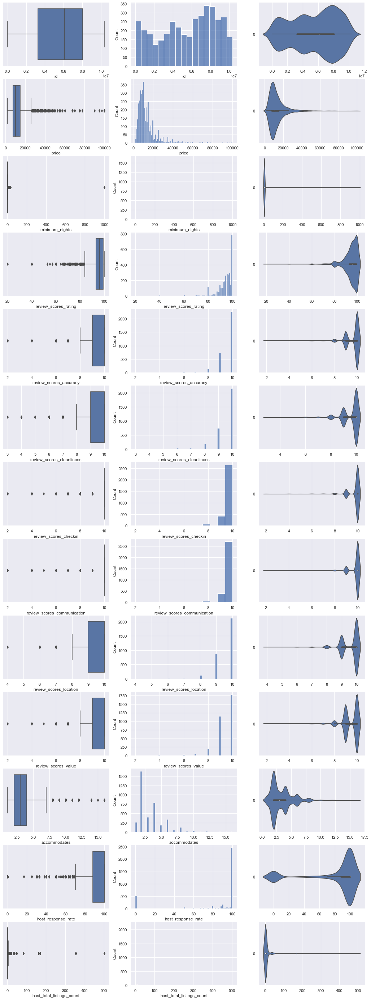

In [35]:
f, axes = plt.subplots(13, 3, figsize=(18, 50))

count = 0
for var in numeric_predictors:
    try:
        sb.boxplot(x =numeric_predictors[var], orient = "h" , ax = axes[count,0])
        sb.histplot( numeric_predictors[var], ax = axes[count,1])
        sb.violinplot(data=numeric_predictors[var], ax = axes[count,2],orient='h')
    except:
        pass
    count += 1

<span style="color:red"> Data to clean because of abnormalies: minimum_nights & host_total_listings_count </span>

In [25]:
response_pair = response[['id',"total_reviews_per_days_of_existence",'reviews_per_month']]
concate_df = pd.concat([response_pair,numeric_predictors],axis = 1 )
concate_df.head()

,id,total_reviews_per_days_of_existence,reviews_per_month,id,price,minimum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,accommodates,host_response_rate,host_total_listings_count
0,241032,0.128731,4.07,241032,8500,1,95.0,10.0,10.0,10.0,10.0,9.0,10.0,4,96,3.0
1,953595,0.041031,1.48,953595,15000,2,96.0,10.0,10.0,10.0,10.0,10.0,10.0,4,98,6.0
2,3308979,0.034965,1.15,3308979,97500,4,97.0,10.0,10.0,10.0,10.0,10.0,10.0,11,67,2.0
3,7421966,0.000000,NaN,7421966,10000,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,0,1.0
4,278830,0.025367,0.89,278830,45000,1,92.0,9.0,9.0,10.0,10.0,9.0,9.0,6,100,2.0


                   reviews_per_month     price
reviews_per_month           1.000000 -0.218588
price                      -0.218588  1.000000

                   reviews_per_month  minimum_nights
reviews_per_month           1.000000       -0.034225
minimum_nights             -0.034225        1.000000

                      reviews_per_month  review_scores_rating
reviews_per_month              1.000000              0.087313
review_scores_rating           0.087313              1.000000

                        reviews_per_month  review_scores_accuracy
reviews_per_month                1.000000                0.143613
review_scores_accuracy           0.143613                1.000000

                           reviews_per_month  review_scores_cleanliness
reviews_per_month                   1.000000                   0.133974
review_scores_cleanliness           0.133974                   1.000000

                       reviews_per_month  review_scores_checkin
reviews_per_month              

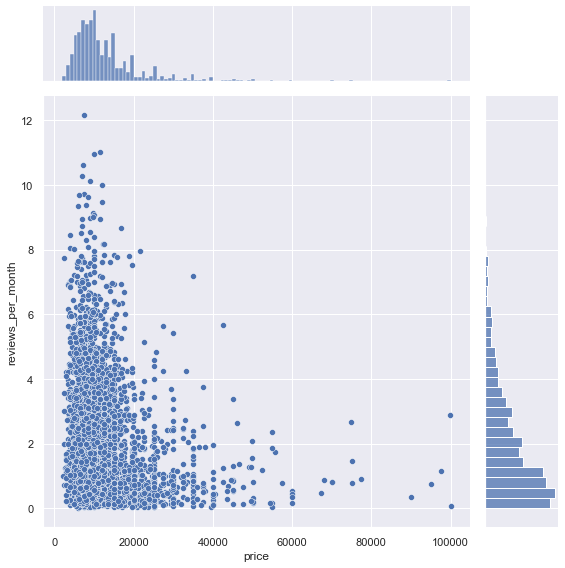

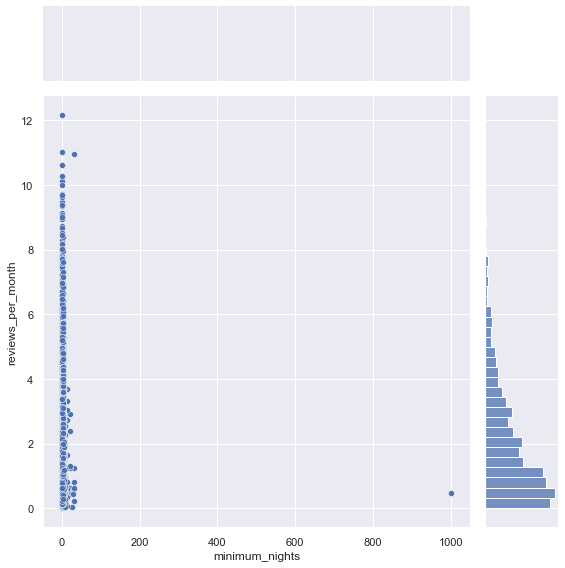

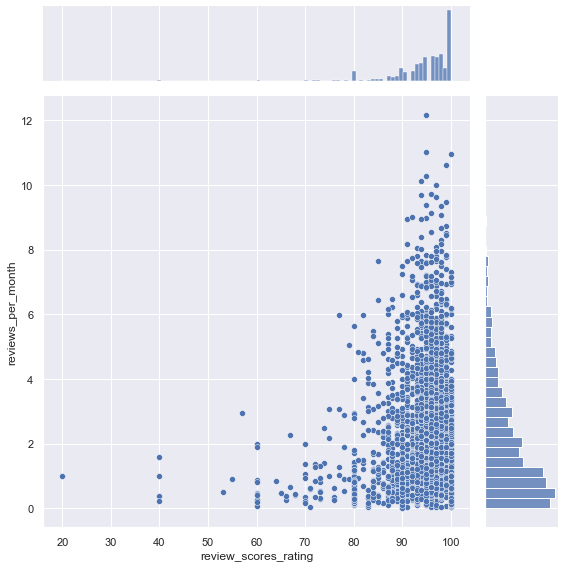

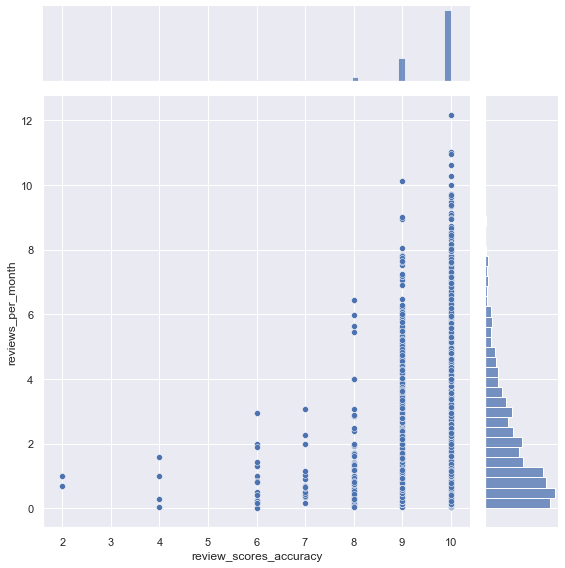

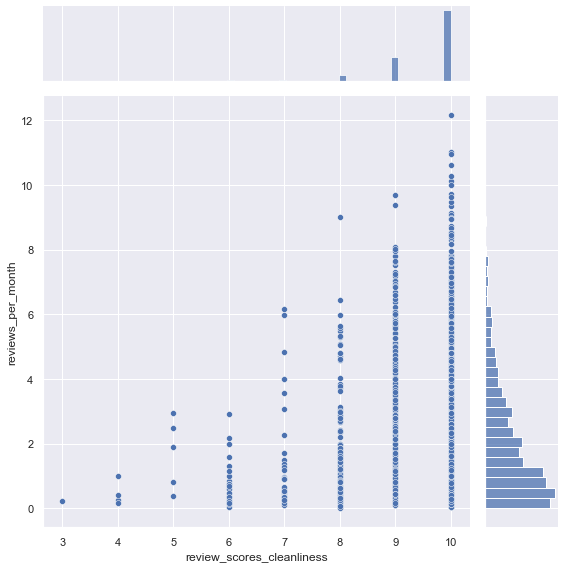

...

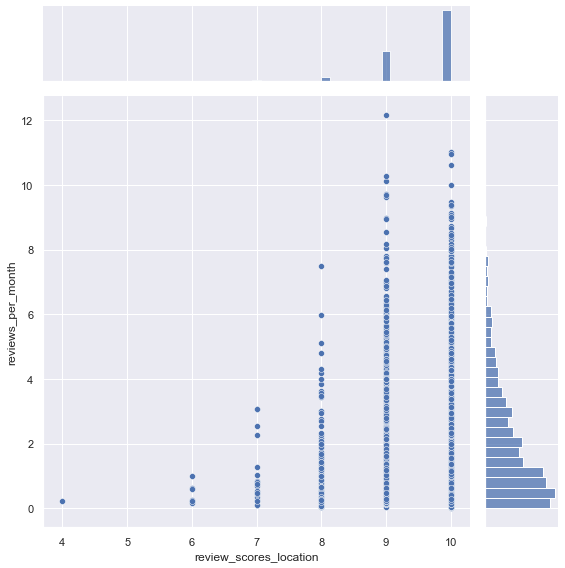

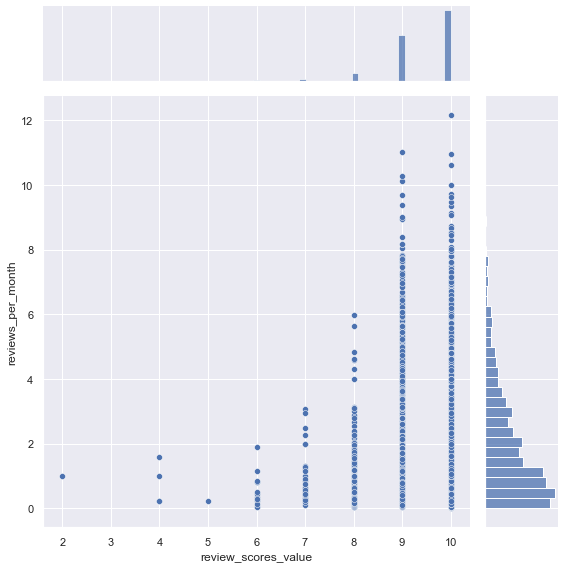

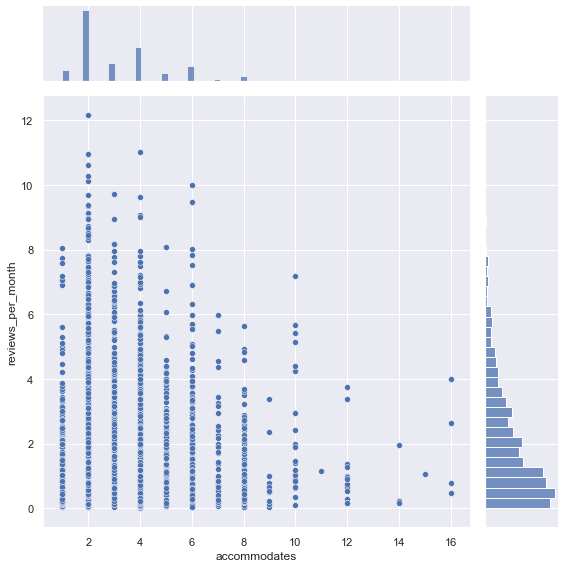

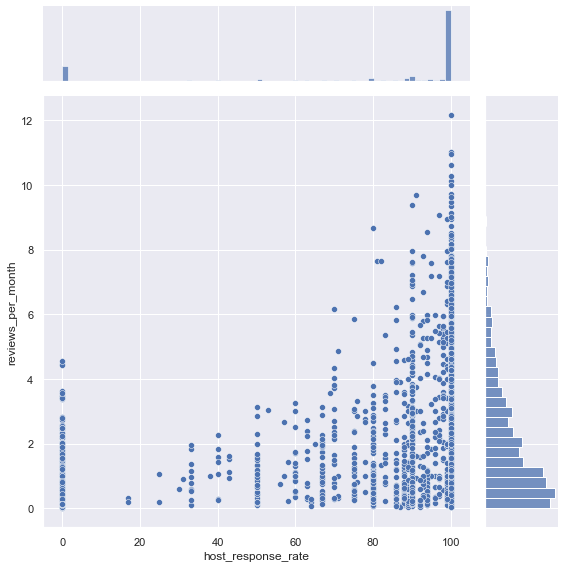

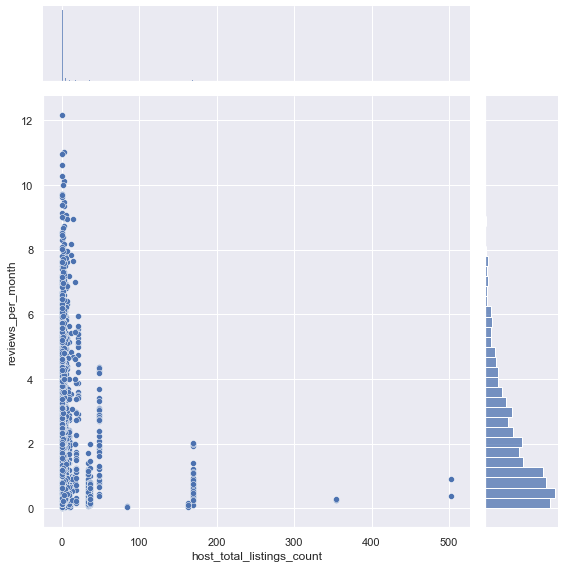

In [26]:
#Analysis for reviews/month.

count = 0

for var in concate_df:
    if (var == 'reviews_per_month')|(var ==  'total_reviews_per_days_of_existence' )| (var =="id"):
        pass
    else:
        placeholder_df = concate_df[["reviews_per_month" , var]]
        
        sb.jointplot(x = placeholder_df[var], y = placeholder_df["reviews_per_month"], height = 8 )
        print(placeholder_df.corr())
        print()
        
        count += 1

                                     total_reviews_per_days_of_existence  \
total_reviews_per_days_of_existence                             1.000000   
price                                                          -0.149762   

                                        price  
total_reviews_per_days_of_existence -0.149762  
price                                1.000000  

                                     total_reviews_per_days_of_existence  \
total_reviews_per_days_of_existence                             1.000000   
minimum_nights                                                 -0.023507   

                                     minimum_nights  
total_reviews_per_days_of_existence       -0.023507  
minimum_nights                             1.000000  

                                     total_reviews_per_days_of_existence  \
total_reviews_per_days_of_existence                             1.000000   
review_scores_rating                                            0.058818   

     

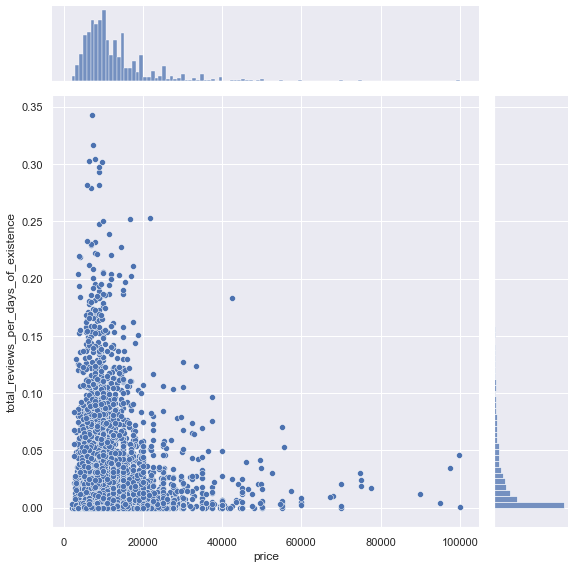

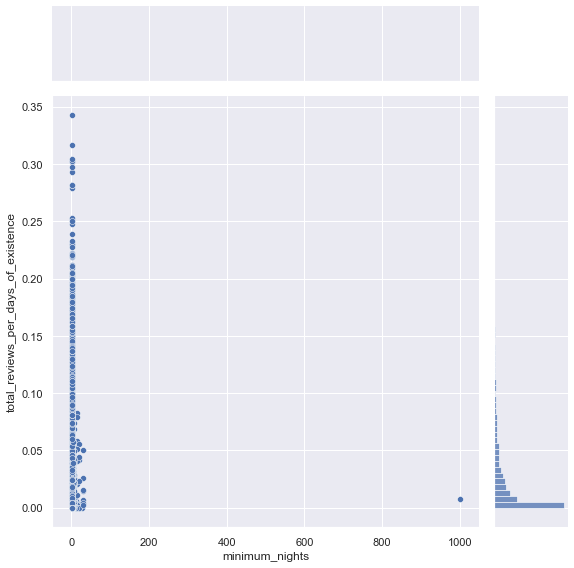

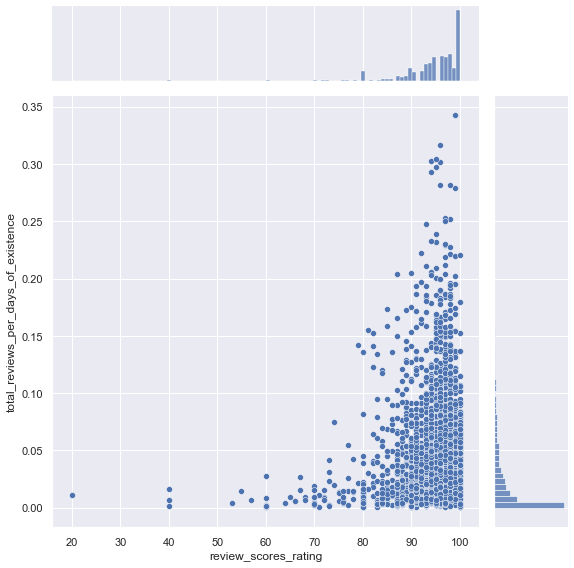

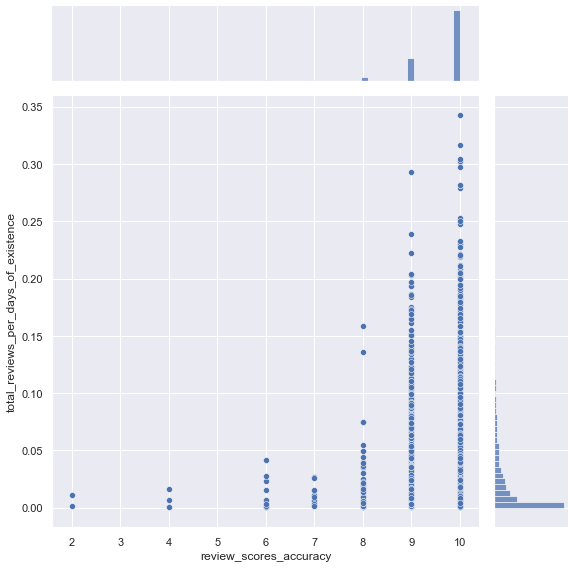

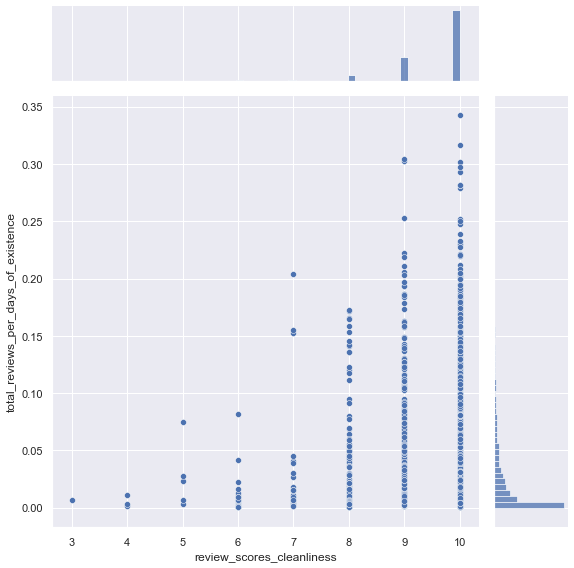

...

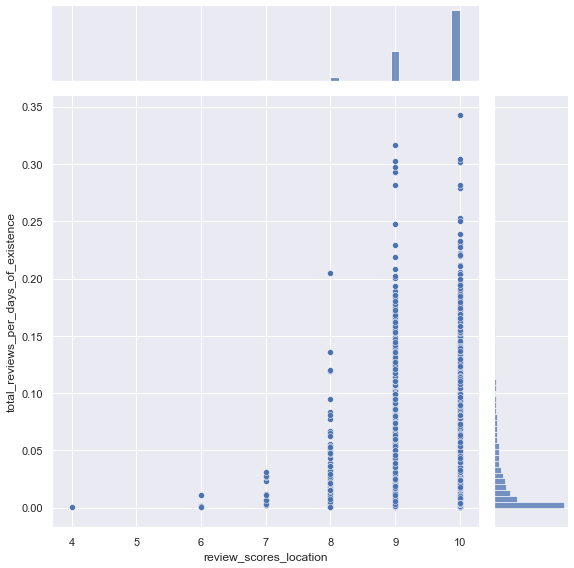

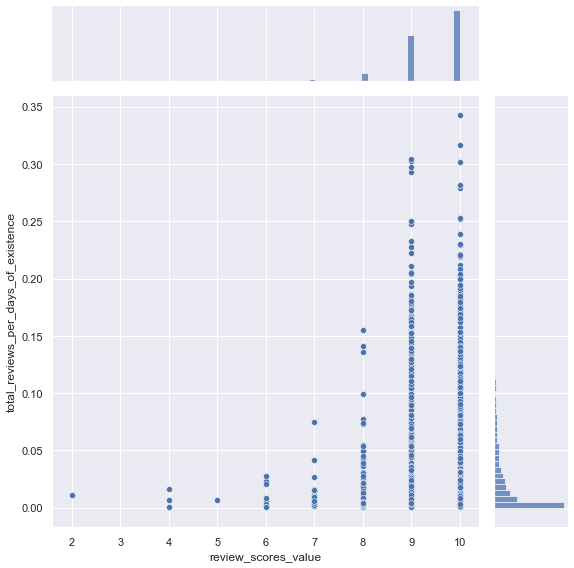

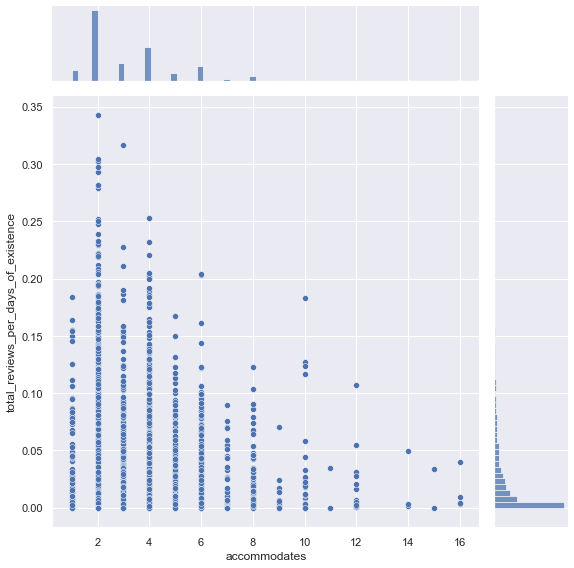

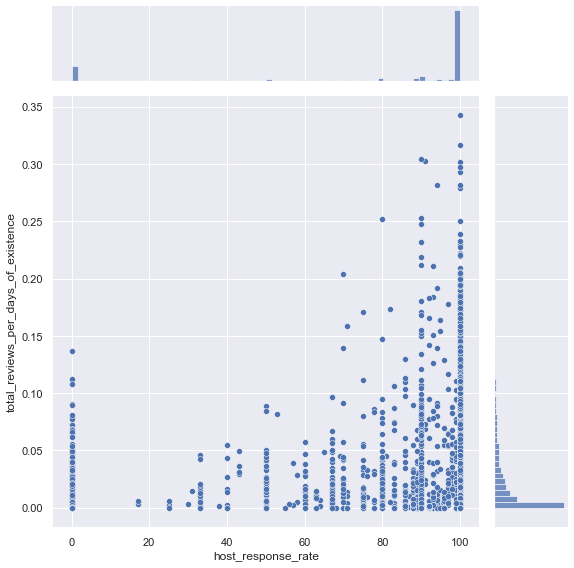

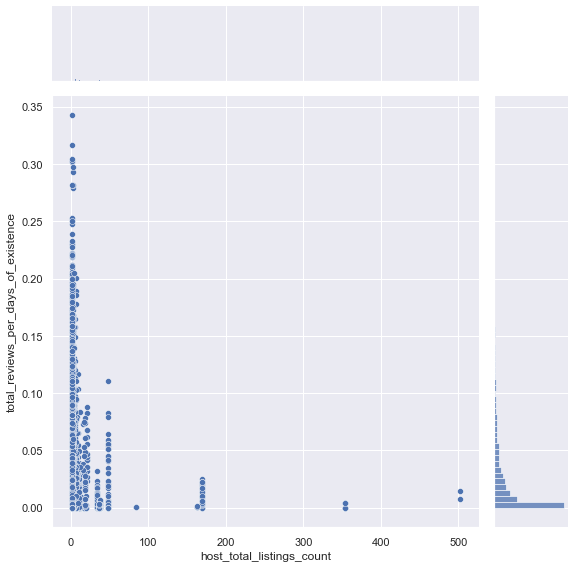

In [27]:
#Analysis for reviews/day.

count = 0

for var in concate_df:
    if (var == 'reviews_per_month')|(var ==  'total_reviews_per_days_of_existence' )| (var =="id"):
        pass
    else:
        placeholder_df = concate_df[["total_reviews_per_days_of_existence" , var]]
        
        sb.jointplot(x = placeholder_df[var], y = placeholder_df["total_reviews_per_days_of_existence"], height = 8 )
        print(placeholder_df.corr())
        print()
        
        count += 1

C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 13.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 19.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 6.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\A

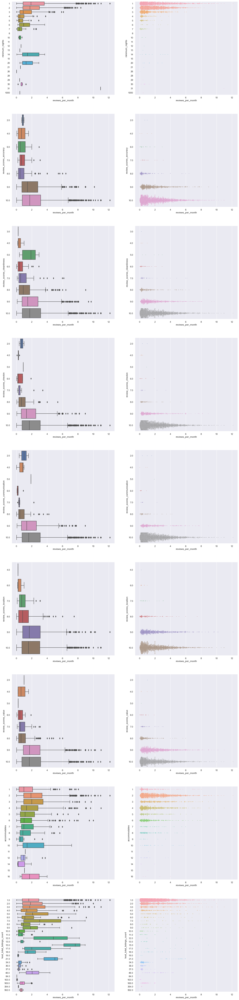

In [59]:
#Analysis for reviews/month.
f, axes = plt.subplots(9, 2, figsize=(20, 90))

box_and_swarm_plot_var = ["minimum_nights", "review_scores_accuracy",
                          "review_scores_cleanliness", "review_scores_checkin", "review_scores_communication",
                          "review_scores_location", "review_scores_value", "accommodates", "host_total_listings_count"]

count = 0
for var in box_and_swarm_plot_var:
    sb.boxplot(x = "reviews_per_month", y = var, data = concate_df, orient = "h", ax = axes[count, 0])
    sb.swarmplot(x = "reviews_per_month", y = var, data = concate_df, orient = "h", s = 1.5, ax = axes[count, 1])
    count += 1

C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 48.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 43.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 31.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\

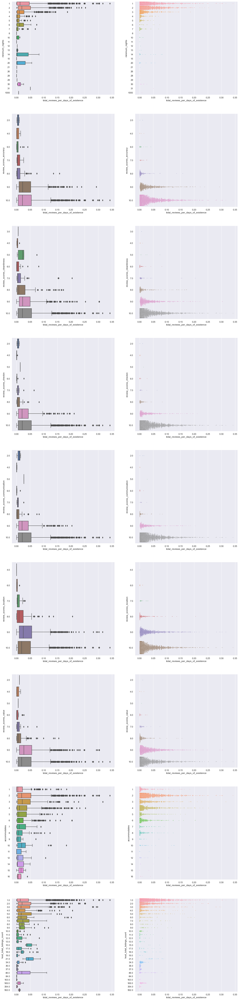

In [60]:
#Analysis for reviews/day.
f, axes = plt.subplots(9, 2, figsize=(20, 90))

box_and_swarm_plot_var = ["minimum_nights", "review_scores_accuracy",
                          "review_scores_cleanliness", "review_scores_checkin", "review_scores_communication",
                          "review_scores_location", "review_scores_value", "accommodates", "host_total_listings_count"]

count = 0
for var in box_and_swarm_plot_var:
    sb.boxplot(x = "total_reviews_per_days_of_existence", y = var, data = concate_df, orient = "h", ax = axes[count, 0])
    sb.swarmplot(x = "total_reviews_per_days_of_existence", y = var, data = concate_df, orient = "h", s = 1.5, ax = axes[count, 1])
    count += 1

Numerical predictors vs numerical 2 responses done.

Left with:
1. one hot
2. integer
3. amenities (integer also)
4. string (clive to do)

FOR DATA VISUALISATION
END OF THURSDAY GET THIS DONE

need to take out outliers for which ones?

Then can finally regress the shits.

## 2.2. Visualisations for One Hot vs Both Responses
As One Hot was based on Categorical Data, we will use boxplots and swarmplots to map their relationship with both responses out. This will initially use ther original categorical forms.

In [35]:
one_hot_df.head()

,id,nc_Adams,nc_Alki,nc_Arbor Heights,nc_Atlantic,nc_Belltown,nc_Bitter Lake,nc_Briarcliff,nc_Brighton,nc_Broadview,nc_Broadway,nc_Bryant,nc_Cedar Park,nc_Central Business District,nc_Columbia City,nc_Crown Hill,nc_Dunlap,nc_East Queen Anne,nc_Eastlake,nc_Fairmount Park,nc_Fauntleroy,nc_First Hill,nc_Fremont,nc_Gatewood,nc_Genesee,nc_Georgetown,nc_Green Lake,nc_Greenwood,nc_Haller Lake,nc_Harrison/Denny-Blaine,nc_High Point,nc_Highland Park,nc_Holly Park,nc_Industrial District,nc_Interbay,nc_International District,nc_Laurelhurst,nc_Lawton Park,nc_Leschi,nc_Lower Queen Anne,nc_Loyal Heights,nc_Madison Park,nc_Madrona,nc_Mann,nc_Maple Leaf,nc_Matthews Beach,nc_Meadowbrook,nc_Mid-Beacon Hill,nc_Minor,nc_Montlake,nc_Mount Baker,nc_North Admiral,nc_North Beach/Blue Ridge,nc_North Beacon Hill,nc_North College Park,nc_North Delridge,nc_North Queen Anne,nc_Olympic Hills,nc_Phinney Ridge,nc_Pike-Market,nc_Pinehurst,nc_Pioneer Square,nc_Portage Bay,nc_Rainier Beach,nc_Ravenna,nc_Riverview,nc_Roosevelt,nc_Roxhill,nc_Seaview,nc_Seward Park,nc_South Beacon Hill,nc_South Delridge,nc_South Lake Union,nc_South Park,nc_Southeast Magnolia,nc_Stevens,nc_Sunset Hill,nc_University District,nc_Victory Heights,nc_View Ridge,nc_Wallingford,nc_Wedgwood,nc_West Queen Anne,nc_West Woodland,nc_Westlake,nc_Whittier Heights,nc_Windermere,nc_Yesler Terrace,pt_Apartment,pt_Bed & Breakfast,pt_Boat,pt_Bungalow,pt_Cabin,pt_Camper/RV,pt_Chalet,pt_Condominium,pt_Dorm,pt_House,pt_Loft,pt_Other,pt_Tent,pt_Townhouse,pt_Treehouse,pt_Yurt,rt_Entire home/apt,rt_Private room,rt_Shared room,bt_Airbed,bt_Couch,bt_Futon,bt_Pull-out Sofa,bt_Real Bed
0,241032,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
1,953595,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
2,3308979,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1
3,7421966,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
4,278830,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1


In [39]:
#Saved on computer.
one_hot_df.to_csv(r"C:\Users\Clive\Desktop\DSAI Module\Project\One_Hot.csv")

In [38]:
response_pair = response[["total_reviews_per_days_of_existence",'reviews_per_month']]

#One Hot encodings.
one_hot_cat_visualisation_temp_df = predictors3[["id", "neighbourhood_cleansed", "property_type", "room_type",
                                           "bed_type"]]

# Create a joint dataframe by concatenating Total and Legendary
one_hot_cat_visualisation_df = pd.concat([response_pair, one_hot_cat_visualisation_temp_df], axis = 1)

C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 10.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 8.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 15.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\A

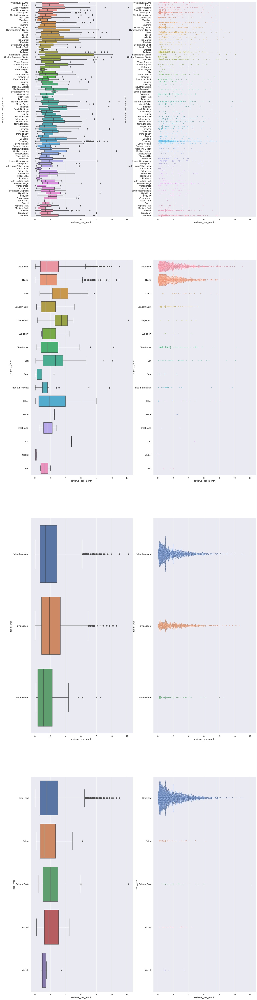

In [31]:
#Analysis for reviews/month.
f, axes = plt.subplots(4, 2, figsize=(20, 90))

count = 0
for var in one_hot_cat_visualisation_temp_df:
    if var == "id":
        pass
    else:
        sb.boxplot(x = "reviews_per_month", y = var,
               data = one_hot_cat_visualisation_df, orient = "h", ax = axes[count, 0])
        sb.swarmplot(x = "reviews_per_month", y = var,
                 data = one_hot_cat_visualisation_df, orient = "h", s = 2, ax = axes[count, 1])
        count += 1

C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 12.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 15.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 7.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 18.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 32.3% of the points 

C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 36.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 36.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 11.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\

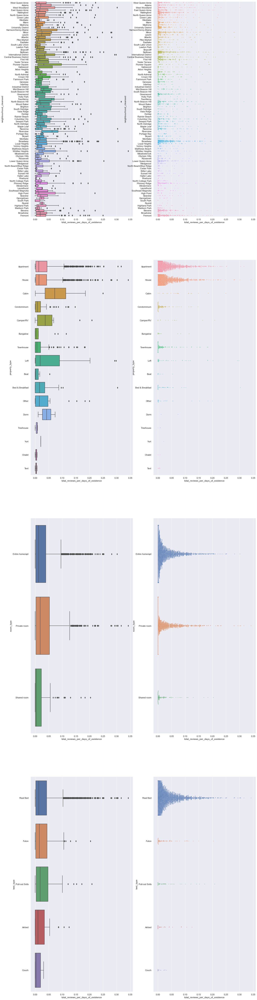

In [32]:
#Analysis for reviews/day.
f, axes = plt.subplots(4, 2, figsize=(20, 90))

count = 0
for var in one_hot_cat_visualisation_temp_df:
    if var == "id":
        pass
    else:
        sb.boxplot(x = "total_reviews_per_days_of_existence", y = var,
               data = one_hot_cat_visualisation_df, orient = "h", ax = axes[count, 0])
        sb.swarmplot(x = "total_reviews_per_days_of_existence", y = var,
                 data = one_hot_cat_visualisation_df, orient = "h", s = 2, ax = axes[count, 1])
        count += 1

## 2.3. Visualisations for Integer Encoders vs Both Responses
As the integer encoders are originally categorical, we will use boxplots and swarmplots to visualise the datas' relationships with the response.

In [37]:
integer_encoder_df.head(100)

,id,host_response_time,host_is_superhost,cancellation_policy,instant_bookable,require_guest_profile_picture,require_guest_phone_verification
0,241032,1.0,0.0,1,0,0,0
1,953595,0.0,1.0,2,0,1,1
2,3308979,1.0,0.0,2,0,0,0
3,7421966,-1.0,0.0,0,0,0,0
4,278830,0.0,0.0,2,0,0,0
5,5956968,-1.0,0.0,2,0,0,0
6,1909058,0.0,1.0,1,0,0,0
7,856550,0.0,1.0,2,0,1,1
8,4948745,-1.0,0.0,2,0,0,0
9,2493658,0.0,1.0,2,0,1,1


In [42]:
#Placeholder dataframe for response.
integer_encod_cat_temp_df = predictors3[["id","host_response_time",'host_is_superhost','cancellation_policy','instant_bookable',
                       'require_guest_profile_picture','require_guest_phone_verification']]

response_pair = response[["total_reviews_per_days_of_existence",'reviews_per_month']]

#Full dataframe for the responses that were integer encoded.
integer_encod_visualisation_df = pd.concat([response_pair, integer_encod_cat_temp_df], axis = 1)

C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorica

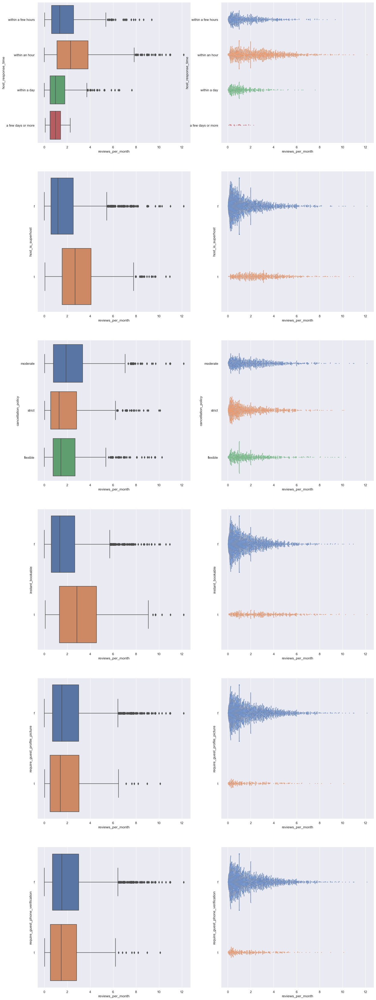

In [44]:
#Analysis for reviews/month.
f, axes = plt.subplots(6, 2, figsize=(20, 60))

count = 0
for var in integer_encod_cat_temp_df:
    if var == "id":
        pass
    else:
        sb.boxplot(x = "reviews_per_month", y = var,
               data = integer_encod_visualisation_df, orient = "h", ax = axes[count, 0])
        sb.swarmplot(x = "reviews_per_month", y = var,
                 data = integer_encod_visualisation_df, orient = "h", s = 2, ax = axes[count, 1])
        count += 1

C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 13.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 14.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 18.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 29.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value en

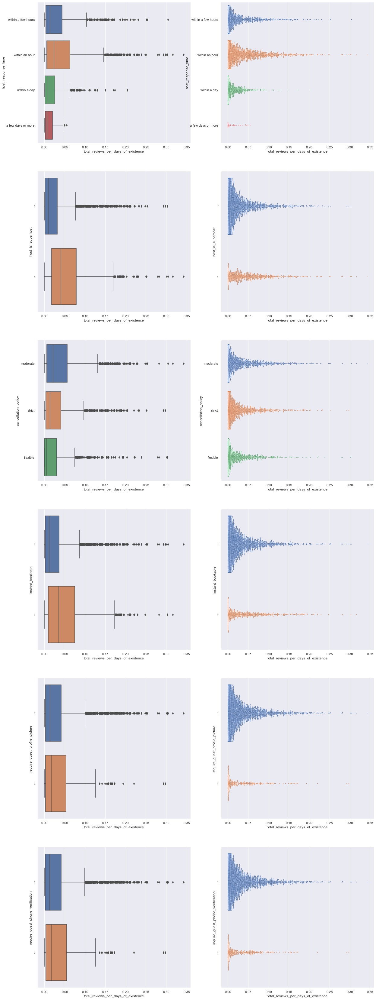

In [46]:
#Analysis for reviews/day.
f, axes = plt.subplots(6, 2, figsize=(20, 60))

count = 0
for var in integer_encod_cat_temp_df:
    if var == "id":
        pass
    else:
        sb.boxplot(x = "total_reviews_per_days_of_existence", y = var,
               data = integer_encod_visualisation_df, orient = "h", ax = axes[count, 0])
        sb.swarmplot(x = "total_reviews_per_days_of_existence", y = var,
                 data = integer_encod_visualisation_df, orient = "h", s = 1.5, ax = axes[count, 1])
        count += 1

## 2.4. Visualisations for Amenities vs Both Responses

In [38]:
response_pair = response[["total_reviews_per_days_of_existence",'reviews_per_month']]

#Full dataframe for the amenities and both predictors.
amenities_visualisation_df = pd.concat([response_pair, amenities_one_hot_df], axis = 1)
amenities_visualisation_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3818 entries, 0 to 3817
Data columns (total 44 columns):
total_reviews_per_days_of_existence    3816 non-null float64
reviews_per_month                      3191 non-null float64
id                                     3818 non-null int64
"24-Hour Check-in"                     3818 non-null int64
"Air Conditioning"                     3818 non-null int64
"Buzzer/Wireless Intercom"             3818 non-null int64
"Cable TV"                             3818 non-null int64
"Carbon Monoxide Detector"             3818 non-null int64
"Elevator in Building"                 3818 non-null int64
"Family/Kid Friendly"                  3818 non-null int64
"Fire Extinguisher"                    3818 non-null int64
"First Aid Kit"                        3818 non-null int64
"Free Parking on Premises"             3818 non-null int64
"Hair Dryer"                           3818 non-null int64
"Hot Tub"                              3818 non-null int64
"Ind

C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 41.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 25.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 41.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\

C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 43.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 15.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarnin

C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 44.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 11.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 31.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\

C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 26.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 38.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarnin

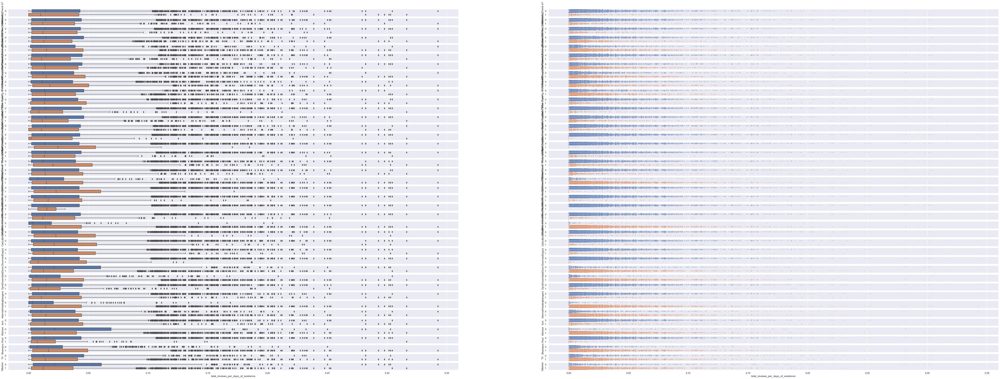

In [73]:
#VERY LONG: BEWARE

#Analysis for reviews/day.
f, axes = plt.subplots(41, 2, figsize=(80, 60))

count = 0
for var in amenities_one_hot_df:
    if var == "id":
        pass
    else:
        sb.boxplot(x = "total_reviews_per_days_of_existence", y = var,
               data = amenities_visualisation_df, orient = "h", ax = axes[count, 0])
        sb.swarmplot(x = "total_reviews_per_days_of_existence", y = var,
                 data = amenities_visualisation_df, orient = "h", s = 1.5, ax = axes[count, 1])
        count += 1

C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorica

C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1282: RuntimeWarning: invalid value encountered in less
  off_low = points < low_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorical.py:1286: RuntimeWarning: invalid value encountered in greater
  off_high = points > high_gutter
C:\Users\Clive\Anaconda3\lib\site-packages\seaborn\categorica

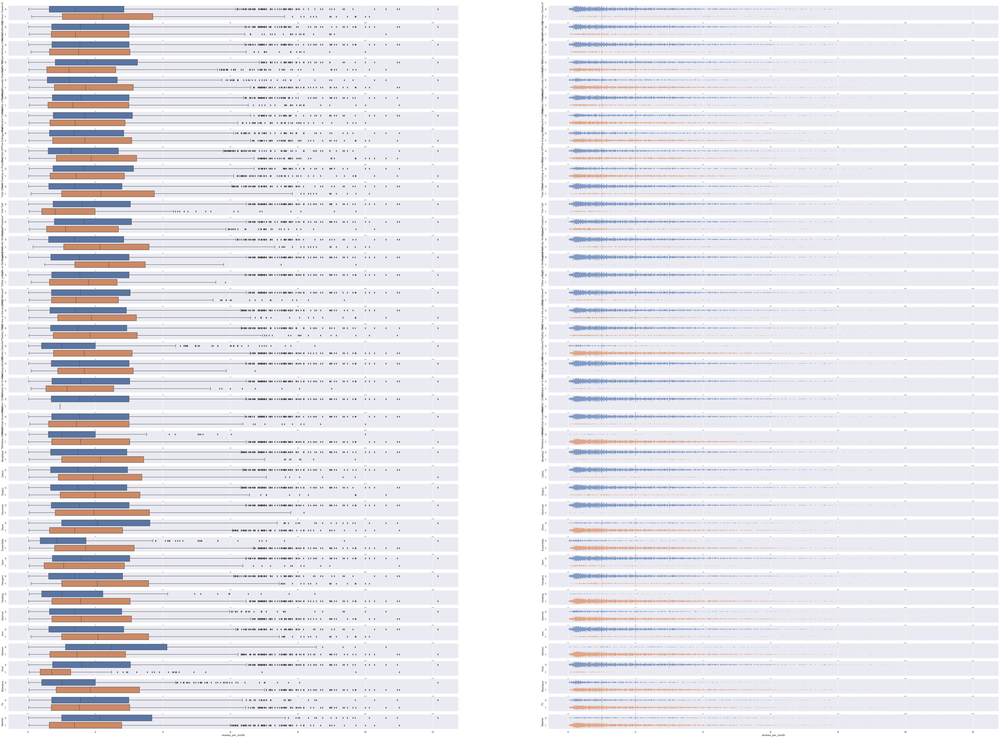

In [66]:
#VERY LONG: BEWARE

#Analysis for reviews/month.
f, axes = plt.subplots(41, 2, figsize=(80, 60))

count = 0
for var in amenities_one_hot_df:
    if var == "id":
        pass
    else:
        sb.boxplot(x = "reviews_per_month", y = var,
               data = amenities_visualisation_df, orient = "h", ax = axes[count, 0])
        sb.swarmplot(x = "reviews_per_month", y = var,
                 data = amenities_visualisation_df, orient = "h", s = 1.5, ax = axes[count, 1])
        count += 1

## 2.5. Visualisations for Positive & Negative word counts vs Both Responses

In [62]:
pos_neg_word_df.describe()

,id,Difference,positive_words_per_review,negative_words_per_review
count,3.818000e+03,3818.000000,3818.000000,3818.000000
mean,5.550111e+06,117.030120,7.159139,2.932564
std,2.962660e+06,207.843485,4.161113,2.202503
min,3.335000e+03,-33.000000,0.000000,0.000000
25%,3.258256e+06,6.000000,5.333333,1.666667
50%,6.118244e+06,40.000000,7.920910,3.000000
75%,8.035127e+06,136.000000,9.629002,4.000000
max,1.034016e+07,2637.000000,33.000000,30.000000


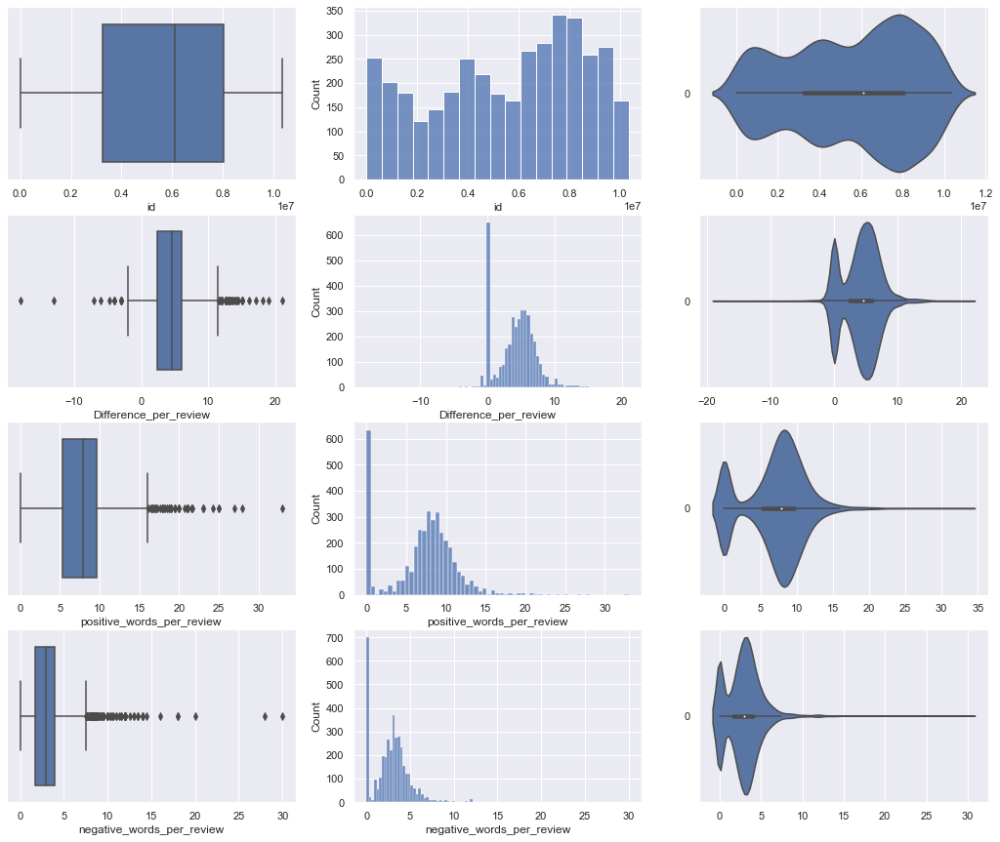

In [11]:
f, axes = plt.subplots(4, 3, figsize=(18, 15))

count = 0
for var in pos_neg_word_df:
    try:
        sb.boxplot(x = pos_neg_word_counts_df[var], orient = "h" , ax = axes[count,0])
        sb.histplot(pos_neg_word_counts_df[var], ax = axes[count,1])
        sb.violinplot(data=pos_neg_word_counts_df[var], ax = axes[count,2],orient='h')
    except:
        pass
    count += 1

In [25]:
response_pair = response[["total_reviews_per_days_of_existence",'reviews_per_month']]

pos_neg_word_counts_visualisation_df = pd.concat([response_pair, pos_neg_word_df], axis = 1)
pos_neg_word_counts_visualisation_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3818 entries, 0 to 3817
Data columns (total 6 columns):
total_reviews_per_days_of_existence    3816 non-null float64
reviews_per_month                      3191 non-null float64
id                                     3818 non-null int64
Difference_per_review                  3818 non-null float64
positive_words_per_review              3818 non-null float64
negative_words_per_review              3818 non-null float64
dtypes: float64(5), int64(1)
memory usage: 179.0 KB


                       reviews_per_month  Difference_per_review
reviews_per_month                1.00000                0.03967
Difference_per_review            0.03967                1.00000

                           reviews_per_month  positive_words_per_review
reviews_per_month                   1.000000                  -0.020464
positive_words_per_review          -0.020464                   1.000000

                           reviews_per_month  negative_words_per_review
reviews_per_month                   1.000000                  -0.081057
negative_words_per_review          -0.081057                   1.000000



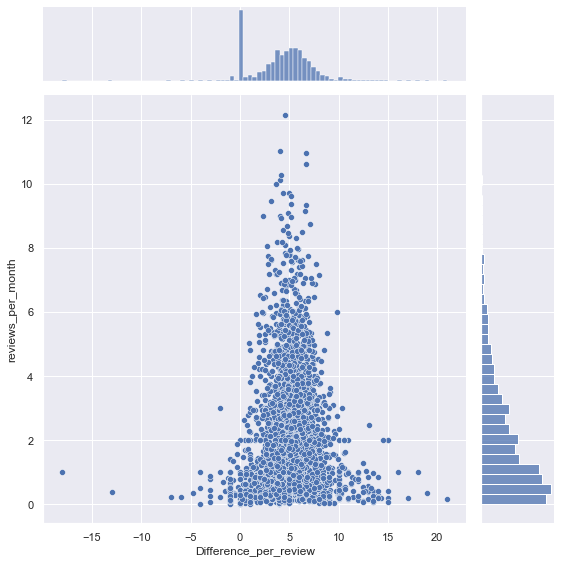

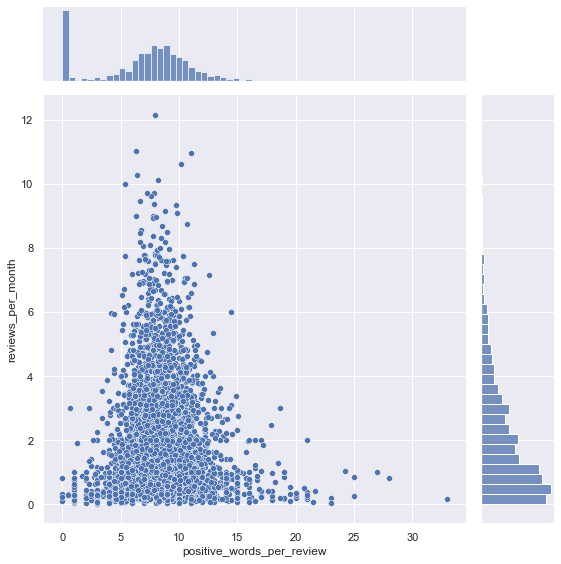

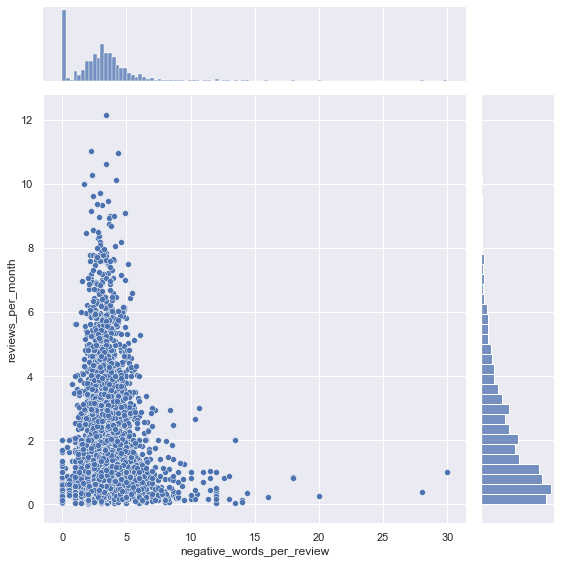

In [26]:
#Analysis for reviews/month.

count = 0

for var in pos_neg_word_counts_visualisation_df:
    if (var == 'reviews_per_month')|(var ==  'total_reviews_per_days_of_existence' )| (var =="id"):
        pass
    else:
        placeholder_df = pos_neg_word_counts_visualisation_df[["reviews_per_month" , var]]
        
        sb.jointplot(x = placeholder_df[var], y = placeholder_df["reviews_per_month"], height = 8 )
        print(placeholder_df.corr())
        print()
        
        count += 1

                                     total_reviews_per_days_of_existence  \
total_reviews_per_days_of_existence                             1.000000   
Difference_per_review                                           0.241303   

                                     Difference_per_review  
total_reviews_per_days_of_existence               0.241303  
Difference_per_review                             1.000000  

                                     total_reviews_per_days_of_existence  \
total_reviews_per_days_of_existence                             1.000000   
positive_words_per_review                                       0.248413   

                                     positive_words_per_review  
total_reviews_per_days_of_existence                   0.248413  
positive_words_per_review                             1.000000  

                                     total_reviews_per_days_of_existence  \
total_reviews_per_days_of_existence                             1.000000   
negative_w

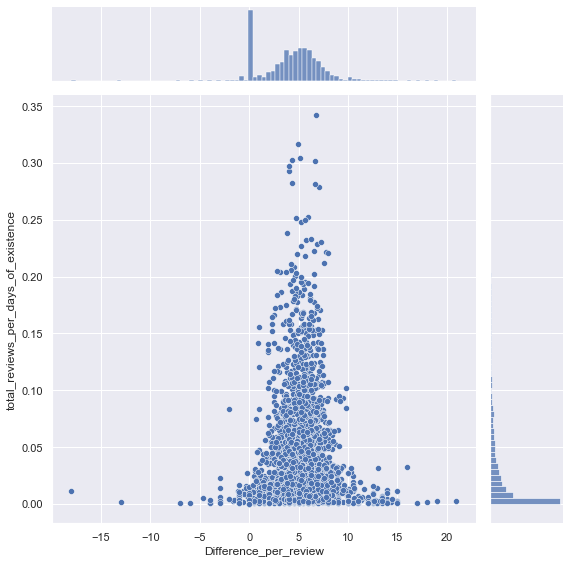

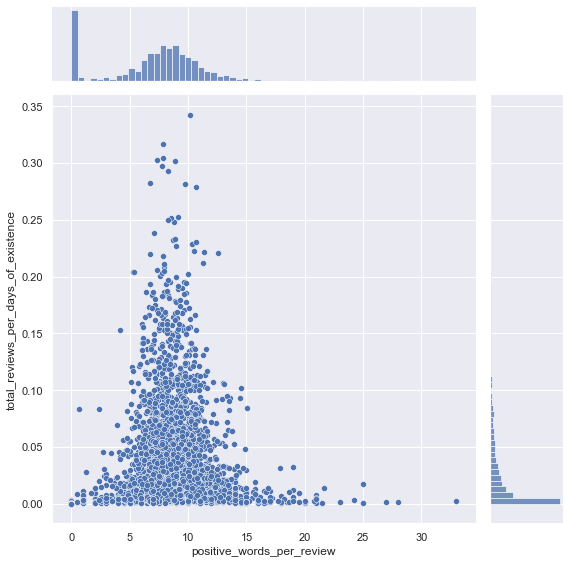

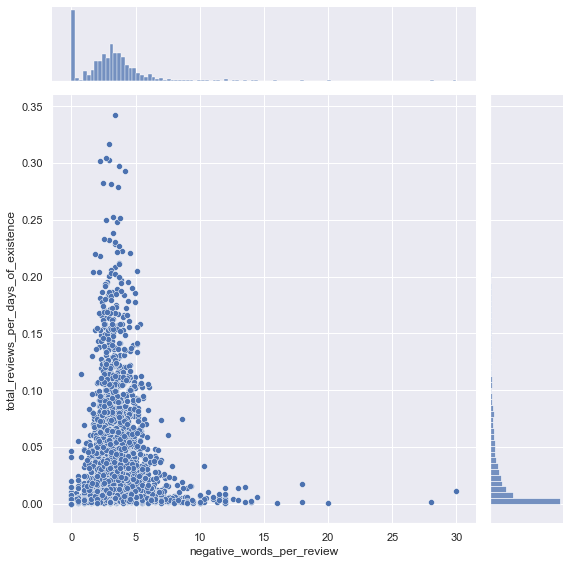

In [27]:
#Analysis for reviews/days.

count = 0

for var in pos_neg_word_counts_visualisation_df:
    if (var == 'reviews_per_month')|(var ==  'total_reviews_per_days_of_existence' )| (var =="id"):
        pass
    else:
        placeholder_df = pos_neg_word_counts_visualisation_df[["total_reviews_per_days_of_existence" , var]]
        
        sb.jointplot(x = placeholder_df[var], y = placeholder_df["total_reviews_per_days_of_existence"], height = 8 )
        print(placeholder_df.corr())
        print()
        
        count += 1